In [1]:
import memilio.simulation.secir as secir
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
from datetime import datetime, date
import time
import seaborn as sns
plt.style.use("seaborn")

import scipy.stats

import plotly.graph_objects as go
# import plotly.express as px
# https://plotly.com/python/parallel-coordinates-plot/
# https://plotly.com/python-api-reference/generated/plotly.graph_objects.Figure.html
# https://plotly.com/python/reference/parcoords/

In [2]:
# openturns libraries

from __future__ import print_function
import openturns as ot
import openturns.viewer as viewer
ot.Log.Show(ot.Log.NONE)

import pickle
import json

In [3]:
np.sum([40000, 70000, 190000, 290000, 180000, 60000] )

830000

In [4]:
path_simulation_result = 'Studies/Sobol_MC_50000_InfectedDead.pkl'
path_data = 'data/worldometer_data.txt'

In [5]:
# Define Comartment names
compartments = ['susceptible', 'exposed', 'carrier', 'infected', 'hospitalized', 'icu', 'recovered', 'dead']
Compartments = ['Susceptible', 'Exposed', 'Carrier', 'Infected', 'Hospitalized', 'ICU', 'Recovered', 'Dead']
# Define age Groups
groups = ['0-4', '5-14', '15-34', '35-59', '60-79', '80+']

In [6]:
with open(path_simulation_result, 'rb') as f:
    size = pickle.load(f)
    input_factor_names = pickle.load(f)
    distributions = pickle.load(f) # saved as coll (collection of distributions)
    static_params = pickle.load(f)
    inputDesign = pickle.load(f)
    sim_out = pickle.load(f)
    runtime = pickle.load(f)

In [7]:
print(f"Size of Monte Carlo experiment is {size}.")
print(f"The Monte Carlo experiment needed {runtime} s.")
print(f"{len(input_factor_names)} input factors were used.")
print(f"The model was simulated {len(sim_out)} times.")
print("Static params: ", static_params)
#print(f"Considered input factors are {input_factor_names}")

Size of Monte Carlo experiment is 50000.
The Monte Carlo experiment needed 20584.82719063759 s.
80 input factors were used.
The model was simulated 4100000 times.
Static params:  {'num_groups': 6, 'num_compartments': 8, 'populations': [40000, 70000, 190000, 290000, 180000, 60000], 'start_day': 77, 'days': 100, 'dt': 0.1, 'output_index': [3, 7], 'output_operation': 'all'}


In [8]:
number_of_days = static_params['days']
print(number_of_days)

100


In [10]:
# load data
data_dict = {}
with open(path_data) as f:
    lines = f.readlines()
    #data_dict.update(lines[0])
    print(lines[-1])
    for i in range(len(lines)-1):
        (key, value) = lines[i].split(":")
        value = json.loads(value)
        data_dict[key] = value
print(data_dict.keys())

start_dataset = 32
print(data_dict['categories'][start_dataset])

# when used for a different time period, initial numbers must be matched first. 
# Saved simulation is from start day 0, therefore no initial numbers in Hospitalized, Infected and Recovered
# Divide by 100 because of the population size used in the model
dataset = np.zeros((number_of_days+1, len(static_params['output_index'])))
dataset[:, 0] = np.array(data_dict['currently_infected'][start_dataset:number_of_days+1+start_dataset])/100.0
dataset[:, 1] = np.array(data_dict['total_deaths'][start_dataset:number_of_days+1+start_dataset])/100.0

source : "https://www.worldometers.info/coronavirus/country/germany/#graph-deaths-daily"

dict_keys(['categories', 'currently_infected', 'total_deaths', 'new_recoveries'])
Mar 18, 2020


In [11]:
def aggregate_output(aggregation_function, output_no, number_of_days = number_of_days):

    if aggregation_function == "max":
        output_agg = np.max(sim_out[:, :number_of_days, output_no], axis = 1, keepdims = True)
    elif aggregation_function == "sum":
        output_agg = np.sum(sim_out[:, :number_of_days, output_no], axis = 1, keepdims=True)
    elif aggregation_function == "mean":
        output_agg = np.mean(sim_out[:, :number_of_days, output_no], axis = 1, keepdims=True)
    elif aggregation_function == "mse":
        output_agg = ((np.array(sim_out[:, :, output_no]) - dataset[:, output_no])**2).mean(axis = 1, keepdims = True)
    #print(f"Aggregated output is {aggregation_function} {output_compartment}.")
    return output_agg

def get_output_name(aggregation_function, output_no):
    out_comp = compartments[static_params['output_index'][output_no]]
    return f"{aggregation_function} {out_comp}"

In [49]:
# create list which contains all outputs of interest
outputs = []
output_names = []
df_outputs = pd.DataFrame()
for agg in ["max", "mse"]:
    for out_id in [0, 1]:
        out_comp = compartments[static_params['output_index'][out_id]]
        print(f"Aggregated output is {agg} {out_comp}.")
        outputs.append(aggregate_output(agg, out_id))
        output_names.append(f"{agg} {out_comp}")
        df_outputs[f"{agg} {out_comp}"] = np.squeeze(aggregate_output(agg, out_id))
print(len(outputs))       
print(output_names)

Aggregated output is max infected.
Aggregated output is max dead.
Aggregated output is mse infected.
Aggregated output is mse dead.
4
['max infected', 'max dead', 'mse infected', 'mse dead']


In [16]:
df_outputs

,max infected,max dead,mse infected,mse dead
0,132712.913066,7093.199877,132712.913066,7093.199877
1,2085.479331,95.904749,2085.479331,95.904749
2,162371.026236,6569.578649,162371.026236,6569.578649
3,153812.754139,7053.420183,153812.754139,7053.420183
4,56503.508048,2061.782461,56503.508048,2061.782461
...,...,...,...,...
4099995,8515.133016,773.053680,8515.133016,773.053680
4099996,24811.186922,188.489031,24811.186922,188.489031
4099997,127891.175959,6117.971175,127891.175959,6117.971175
4099998,38464.292088,1312.090862,38464.292088,1312.090862


# Simulation dataframe

Contains input factor values and 4 different outputs from each experiment.

In [51]:
size

50000

In [76]:
# use subset (with size 'n_outputs') for visualization if experiment is very large
n_outputs = 50000
randidx = np.sort(np.random.randint(0, 2*size, n_outputs))

df = inputDesign[randidx].asDataFrame()
i = 0
for agg in ["max", "mse"]:
    for out_id in [0, 1]:
        out_comp = compartments[static_params['output_index'][out_id]]
        df[f"{agg} {out_comp}"] = outputs[i][randidx, 0]
        i += 1
# serial interval is modelled as a factor of incubation time. show the product here to ease interpretablity
#df['serial_interval'] = df['serial_interval']*df['incubation_time']
df.head()

,dummy,incubation_time,serial_interval,infectious_mild_time,hospitalized_to_ICU_time,risk_of_infection_from_symptomatic,max_risk_of_infection_from_symptomatic,seasonality,test_and_trace_capacity,NPI_strength_home,...,deaths_per_ICU_3,deaths_per_ICU_4,deaths_per_ICU_5,init_exposed,init_carrier,init_infected,max infected,max dead,mse infected,mse dead
0,0.629877,6.328056,0.682321,7.357821,5.172217,0.287545,0.320749,0.203147,1.196601,0.358145,...,0.121490,0.328982,0.607527,133.352048,1.434012,123.339832,132712.913066,7093.199877,3.951461e+09,1.017429e+07
1,0.629877,6.328056,0.682321,7.357821,5.172217,0.287545,0.320749,0.203147,1.196601,0.358145,...,0.121490,0.328982,0.607527,133.352048,1.434012,123.339832,132712.913066,7093.199877,3.951461e+09,1.017429e+07
2,0.882805,4.756765,0.713369,5.700597,6.979728,0.137612,0.360677,0.259592,0.906115,0.640269,...,0.160834,0.340170,0.522053,150.623828,98.508571,129.432377,2085.479331,95.904749,6.073591e+05,5.738132e+02
3,0.135276,5.248499,0.684162,6.443841,6.634721,0.275271,0.471808,0.218465,0.954935,0.285374,...,0.119572,0.309089,0.532779,60.475627,190.779848,122.807730,162371.026236,6569.578649,4.545488e+09,9.956037e+06
4,0.135276,5.248499,0.684162,6.443841,6.634721,0.275271,0.471808,0.218465,0.954935,0.285374,...,0.119572,0.309089,0.532779,60.475627,190.779848,122.807730,162371.026236,6569.578649,4.545488e+09,9.956037e+06


## Regional SA / Monte Carlo Filtering

Regional SA considers factors as important which are responsible for simulation outputs in a predefined region of the output space (i.e. above a threshold).

Simulations are divided depending upon the simulation output. This yields a division of the samples of each input factor. It is examined by a statistical test whether the two underlying empirical distributions are significantly different (i.e. if the null that the distributions are equal is rejected). These factors are then considered as important in the setting of regional SA.

In [96]:
plt.rcParams["axes.grid"] = True


In [97]:
threshold = df['max dead'].quantile(q=0.95)
print(threshold)

XA = df[df['max dead'] >= threshold].iloc[:, :len(input_factor_names)]
XB = df[df['max dead'] < threshold].iloc[:, :len(input_factor_names)]

# reject the null hypothesis that the distributions are equal if pvalue is smaller than 0.05
k = len(input_factor_names)
ks_test = {
    'pvalue': [scipy.stats.ks_2samp(XA.iloc[:, i].values, XB.iloc[:, i].values).pvalue for i in range(k) ]
    }
df_filtering = pd.DataFrame(data = ks_test, index = input_factor_names)   
# extract important factors
important_factors = df_filtering[df_filtering['pvalue'] < 0.05].sort_values(by = 'pvalue').index
# show relevant p-values
print(df_filtering[df_filtering['pvalue'] < 0.05].sort_values(by = 'pvalue').to_latex())

9007.52684834953
\begin{tabular}{lr}
\toprule
{} &         pvalue \\
\midrule
serial\_interval                        &   0.000000e+00 \\
hospitalized\_to\_ICU\_time               &  1.366274e-159 \\
infectious\_mild\_time                   &  6.570751e-148 \\
relative\_carrier\_infectability\_3       &  1.172351e-143 \\
relative\_carrier\_infectability\_2       &  5.444252e-134 \\
NPI\_start\_day\_work                     &   1.014896e-67 \\
NPI\_start\_day\_home                     &   6.043872e-67 \\
NPI\_start\_day\_other                    &   2.118536e-64 \\
NPI\_start\_day\_school                   &   2.194003e-53 \\
deaths\_per\_ICU\_4                       &   4.173719e-33 \\
NPI\_strength\_work                      &   4.752645e-30 \\
infection\_probability\_from\_contact\_3   &   2.584467e-22 \\
home\_to\_hospitalized\_time\_5            &   2.257776e-21 \\
NPI\_strength\_home                      &   1.737033e-20 \\
deaths\_per\_ICU\_5                       &   4.185000e-1

/tmp/ipykernel_2655372/890253605.py:16: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df_filtering[df_filtering['pvalue'] < 0.05].sort_values(by = 'pvalue').to_latex())


In [54]:
import statsmodels.api as sm

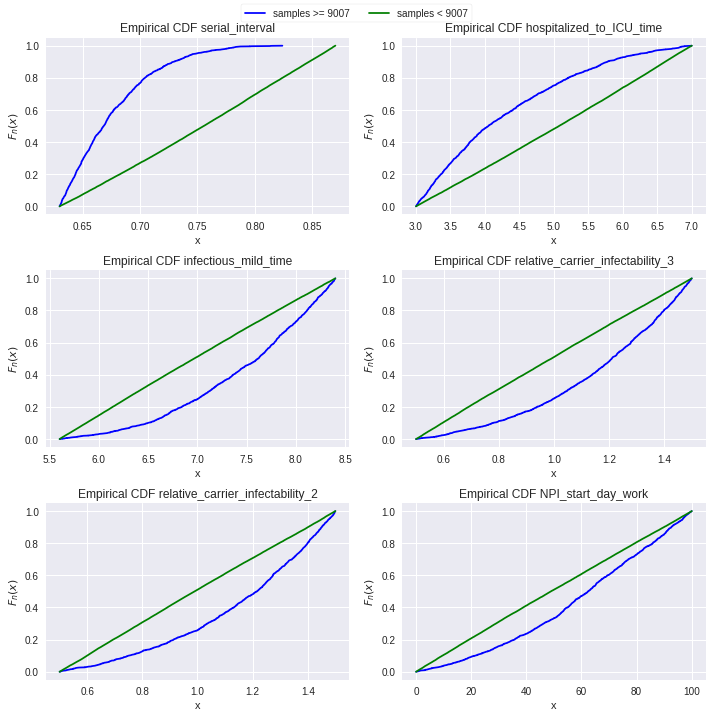

In [98]:
m = 0
fig, ax = plt.subplots(3, 2, figsize=(10,10))
for i in range(3):
    for j in range(2):
        factor_name = important_factors[m]
        sampleA = XA[factor_name].values
        sampleB = XB[factor_name].values
        ax[i,j].plot(np.sort(sampleA), np.linspace(0, 1, len(sampleA), endpoint=False), 
                     label = f'samples >= {int(threshold)}', color = 'blue')
        ax[i,j].plot(np.sort(sampleB), np.linspace(0, 1, len(sampleB), endpoint=False), 
                     label = f'samples < {int(threshold)}', color = 'green')
        ax[i,j].set_title(f"Empirical CDF {factor_name}")
        ax[i,j].set_xlabel('x')
        ax[i,j].set_ylabel(r'$F_n(x)$')
        m += 1

plt.tight_layout()
plt.subplots_adjust(top=0.95) 
#plt.legend(frameon = True, facecolor="white", loc="lower center", ncol=4)
lines_labels = [ax[0,0].get_legend_handles_labels()]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
fig.legend(lines, labels, frameon = True, facecolor="white", loc="upper center", ncol = 2)
#plt.figlegend(lines, labels, loc = 'lower center', ncol=5, labelspacing=0.)
plt.savefig(f'latex_plots/RegionalSA_high_Dead')
plt.show()

In [99]:
def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            #print(j,i)
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def get_top_abs_correlations(df, n=5):
    df_corr = df.corr(method = 'spearman')
    #print(df_corr.shape)
    #print((1-np.tril(np.ones(df_corr.shape))).astype(bool).shape)
    au_corr = df_corr.where((1-np.tril(np.ones(df_corr.shape))).astype(bool)).abs()# 
    #print(au_corr.shape)
    #labels_to_drop = get_redundant_pairs(df)
    #fig = plt.figure(figsize = (12, 12))
    #sns.heatmap(au_corr)
    #plt.show()
    au_corr = au_corr.unstack().sort_values(ascending=False)
    return au_corr[0:n]

print("Largest absolute correlations")
df_corr = get_top_abs_correlations(XA, 15)
df_corr

Largest absolute correlations


NPI_start_day_school              NPI_strength_school                     0.254715
NPI_start_day_other               NPI_strength_other                      0.233301
NPI_start_day_home                NPI_strength_home                       0.216569
NPI_start_day_work                NPI_strength_work                       0.203065
hospitalized_to_ICU_time          infectious_mild_time                    0.176526
relative_carrier_infectability_2  serial_interval                         0.167445
relative_carrier_infectability_3  serial_interval                         0.133358
deaths_per_ICU_4                  hospitalized_to_ICU_time                0.117127
relative_carrier_infectability_3  relative_carrier_infectability_2        0.114098
NPI_start_day_work                NPI_start_day_school                    0.101519
                                  infectious_mild_time                    0.091734
relative_carrier_infectability_3  infection_probability_from_contact_2    0.087974
rela

In [100]:
#df = XA.corr(method = 'spearman').abs().unstack()
#df_ =df.where([False if name[0]==name[1] else True for name in df.index ])
#print(df.drop)

In [117]:
XA.corr(method = 'spearman')['serial_interval'].sort_values(ascending = False).loc['incubation_time']

0.012975012478006523

In [52]:
#fig = plt.figure(figsize = (12, 12))
#df_corr = XA.corr(method = 'spearman')
#sns.heatmap(df_corr.where((np.tril(np.ones(df_corr.shape))).astype(bool)))
#plt.show()

In [44]:
#high_idx = [i for i, o in enumerate(output_agg[:,0]) if o > 11000]

#len(output_agg[high_idx, 0])

1190

## High ouput region: Infections

In [101]:
threshold = df['max infected'].quantile(q=0.95)
print(threshold)

XA = df[df['max infected'] >= threshold].iloc[:, :len(input_factor_names)]
XB = df[df['max infected'] < threshold].iloc[:, :len(input_factor_names)]

# reject the null hypothesis that the distributions are equal if pvalue is smaller than 0.05
k = len(input_factor_names)
ks_test = {
    'pvalue': [scipy.stats.ks_2samp(XA.iloc[:, i].values, XB.iloc[:, i].values).pvalue for i in range(k) ]
    }
df_filtering = pd.DataFrame(data = ks_test, index = input_factor_names)   
# extract important factors
important_factors = df_filtering[df_filtering['pvalue'] < 0.05].sort_values(by = 'pvalue').index
# show relevant p-values
print(df_filtering[df_filtering['pvalue'] < 0.05].sort_values(by = 'pvalue').to_latex())

164317.1188963689
\begin{tabular}{lr}
\toprule
{} &         pvalue \\
\midrule
serial\_interval                        &   0.000000e+00 \\
relative\_carrier\_infectability\_2       &  1.182005e-200 \\
relative\_carrier\_infectability\_3       &  4.232988e-176 \\
infectious\_mild\_time                   &  6.768372e-155 \\
NPI\_start\_day\_work                     &   6.994785e-89 \\
NPI\_start\_day\_home                     &   1.424523e-87 \\
NPI\_start\_day\_other                    &   3.056836e-80 \\
NPI\_start\_day\_school                   &   1.377455e-75 \\
infection\_probability\_from\_contact\_3   &   1.911785e-45 \\
infection\_probability\_from\_contact\_2   &   5.131086e-32 \\
seasonality                            &   6.352052e-20 \\
max\_risk\_of\_infection\_from\_symptomatic &   1.966321e-15 \\
NPI\_strength\_work                      &   1.902665e-14 \\
relative\_carrier\_infectability\_1       &   1.006072e-11 \\
NPI\_strength\_home                      &   9.655993e-1

/tmp/ipykernel_2655372/521487122.py:16: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df_filtering[df_filtering['pvalue'] < 0.05].sort_values(by = 'pvalue').to_latex())


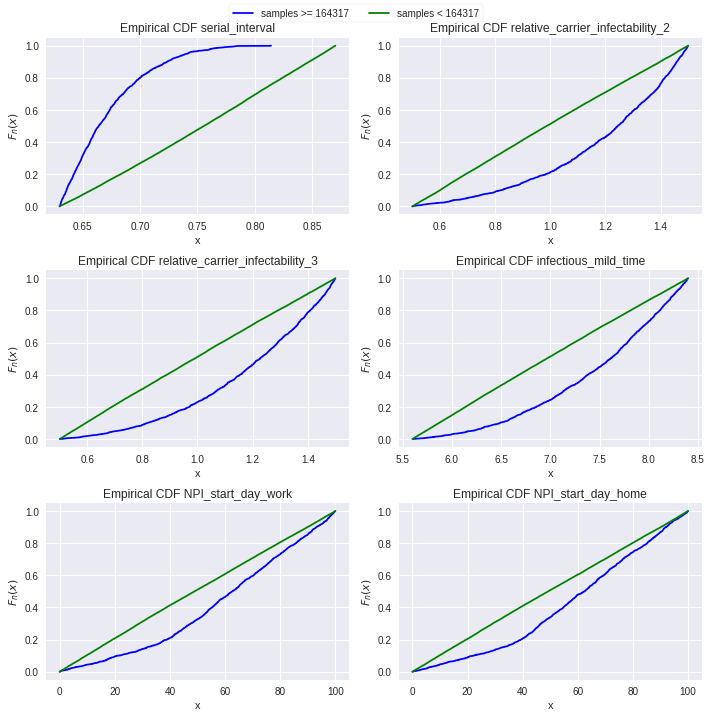

In [102]:
m = 0
fig, ax = plt.subplots(3, 2, figsize=(10,10))
for i in range(3):
    for j in range(2):
        factor_name = important_factors[m]
        sampleA = XA[factor_name].values
        sampleB = XB[factor_name].values
        ax[i,j].plot(np.sort(sampleA), np.linspace(0, 1, len(sampleA), endpoint=False), 
                     label = f'samples >= {int(threshold)}', color = 'blue')
        ax[i,j].plot(np.sort(sampleB), np.linspace(0, 1, len(sampleB), endpoint=False), 
                     label = f'samples < {int(threshold)}', color = 'green')
        ax[i,j].set_title(f"Empirical CDF {factor_name}")
        ax[i,j].set_xlabel('x')
        ax[i,j].set_ylabel(r'$F_n(x)$')
        m += 1

plt.tight_layout()
plt.subplots_adjust(top=0.95) 
#plt.legend(frameon = True, facecolor="white", loc="lower center", ncol=4)
lines_labels = [ax[0,0].get_legend_handles_labels()]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
fig.legend(lines, labels, frameon = True, facecolor="white", loc="upper center", ncol = 2)
#plt.figlegend(lines, labels, loc = 'lower center', ncol=5, labelspacing=0.)
plt.savefig(f'latex_plots/RegionalSA_high_Infected')
plt.show()

In [88]:
def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            #print(j,i)
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def get_top_abs_correlations(df, n=5):
    df_corr = df.corr(method = 'spearman')
    #print(df_corr.shape)
    #print((1-np.tril(np.ones(df_corr.shape))).astype(bool).shape)
    au_corr = df_corr.where((1-np.tril(np.ones(df_corr.shape))).astype(bool)).abs()# 
    #print(au_corr.shape)
    #labels_to_drop = get_redundant_pairs(df)
    #fig = plt.figure(figsize = (12, 12))
    #sns.heatmap(au_corr)
    #plt.show()
    au_corr = au_corr.unstack().sort_values(ascending=False)
    return au_corr[0:n]

print("Largest absolute correlations")
df_corr = get_top_abs_correlations(XA, 15)
df_corr

Largest absolute correlations


NPI_start_day_school                  NPI_strength_school                     0.246097
NPI_start_day_other                   NPI_strength_other                      0.201517
NPI_start_day_work                    NPI_strength_work                       0.196451
NPI_start_day_home                    NPI_strength_home                       0.170069
relative_carrier_infectability_2      serial_interval                         0.143203
infectious_mild_time                  serial_interval                         0.140175
relative_carrier_infectability_2      infectious_mild_time                    0.138332
relative_carrier_infectability_3      infectious_mild_time                    0.131411
                                      relative_carrier_infectability_2        0.130040
                                      serial_interval                         0.119220
NPI_start_day_other                   NPI_start_day_work                      0.116029
infection_probability_from_contact_3  seria

## Low output region:Dead


In [89]:
threshold = df['max dead'].quantile(q=0.05)
print(threshold)

XA = df[df['max dead'] <= threshold].iloc[:, :len(input_factor_names)]
XB = df[df['max dead'] > threshold].iloc[:, :len(input_factor_names)]

# reject the null hypothesis that the distributions are equal if pvalue is smaller than 0.05
k = len(input_factor_names)
ks_test = {
    'pvalue': [scipy.stats.ks_2samp(XA.iloc[:, i].values, XB.iloc[:, i].values).pvalue for i in range(k) ]
    }
df_filtering = pd.DataFrame(data = ks_test, index = input_factor_names)   
# extract important factors
important_factors = df_filtering[df_filtering['pvalue'] < 0.05].sort_values(by = 'pvalue').index
# show relevant p-values
print(df_filtering[df_filtering['pvalue'] < 0.05].sort_values(by = 'pvalue').to_latex())

20.09426186763812
\begin{tabular}{lr}
\toprule
{} &         pvalue \\
\midrule
serial\_interval                        &   0.000000e+00 \\
init\_carrier                           &  1.448016e-127 \\
risk\_of\_infection\_from\_symptomatic     &  1.459674e-110 \\
relative\_carrier\_infectability\_2       &   3.968587e-66 \\
init\_exposed                           &   1.049489e-65 \\
NPI\_strength\_school                    &   8.790556e-59 \\
relative\_carrier\_infectability\_3       &   2.774870e-55 \\
NPI\_strength\_work                      &   1.134165e-52 \\
NPI\_start\_day\_home                     &   4.491381e-52 \\
infectious\_mild\_time                   &   4.787347e-52 \\
NPI\_strength\_home                      &   5.996281e-50 \\
NPI\_start\_day\_school                   &   1.228603e-49 \\
NPI\_start\_day\_other                    &   3.532680e-49 \\
incubation\_time                        &   6.529900e-46 \\
NPI\_start\_day\_work                     &   1.475049e-44 \\
NP

/tmp/ipykernel_2655372/2270010819.py:16: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df_filtering[df_filtering['pvalue'] < 0.05].sort_values(by = 'pvalue').to_latex())


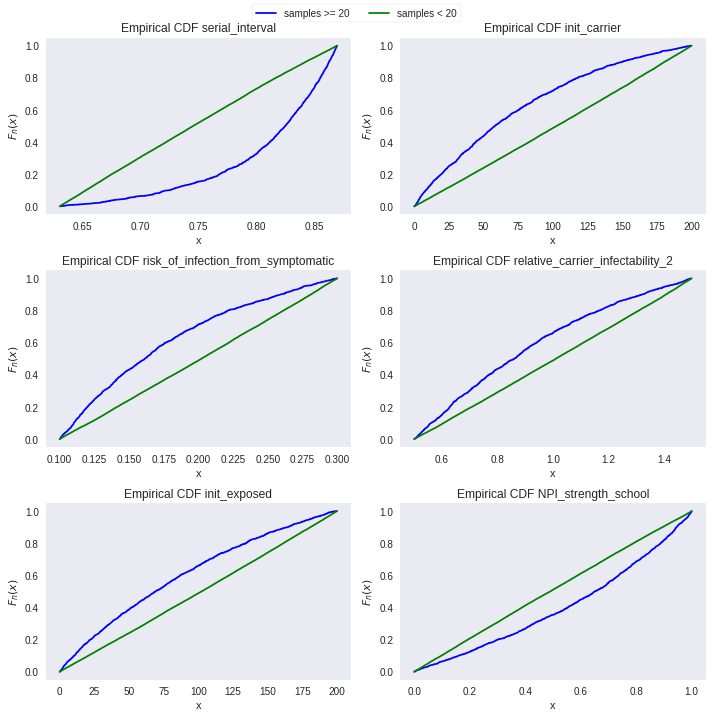

In [90]:
m = 0
fig, ax = plt.subplots(3, 2, figsize=(10,10))
for i in range(3):
    for j in range(2):
        factor_name = important_factors[m]
        sampleA = XA[factor_name].values
        sampleB = XB[factor_name].values
        ax[i,j].plot(np.sort(sampleA), np.linspace(0, 1, len(sampleA), endpoint=False), 
                     label = f'samples >= {int(threshold)}', color = 'blue')
        ax[i,j].plot(np.sort(sampleB), np.linspace(0, 1, len(sampleB), endpoint=False), 
                     label = f'samples < {int(threshold)}', color = 'green')
        ax[i,j].set_title(f"Empirical CDF {factor_name}")
        ax[i,j].set_xlabel('x')
        ax[i,j].set_ylabel(r'$F_n(x)$')
        m += 1

plt.tight_layout()
plt.subplots_adjust(top=0.95) 
#plt.legend(frameon = True, facecolor="white", loc="lower center", ncol=4)
lines_labels = [ax[0,0].get_legend_handles_labels()]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
fig.legend(lines, labels, frameon = True, facecolor="white", loc="upper center", ncol = 2)
#plt.figlegend(lines, labels, loc = 'lower center', ncol=5, labelspacing=0.)
plt.savefig(f'latex_plots/RegionalSA_low_Dead')
plt.show()

In [91]:
print("Largest absolute correlations")
df_corr = get_top_abs_correlations(XA, 15)
df_corr

Largest absolute correlations


NPI_start_day_home                NPI_strength_home       0.326825
NPI_start_day_work                NPI_strength_work       0.299562
NPI_start_day_school              NPI_strength_school     0.279296
NPI_start_day_other               NPI_strength_other      0.276905
                                  NPI_start_day_school    0.173288
NPI_start_day_school              NPI_start_day_home      0.164122
NPI_start_day_work                NPI_start_day_home      0.157715
                                  NPI_start_day_school    0.124413
                                  NPI_strength_home       0.124122
NPI_start_day_other               NPI_start_day_home      0.119824
relative_carrier_infectability_3  NPI_strength_school     0.117267
NPI_start_day_home                NPI_strength_work       0.106284
NPI_start_day_other               NPI_start_day_work      0.102965
NPI_strength_other                serial_interval         0.102482
init_carrier                      infectious_mild_time    0.10

# Low region: Infected

In [103]:
threshold = df['max infected'].quantile(q=0.05)
print(threshold)

XA = df[df['max infected'] <= threshold].iloc[:, :len(input_factor_names)]
XB = df[df['max infected'] > threshold].iloc[:, :len(input_factor_names)]

# reject the null hypothesis that the distributions are equal if pvalue is smaller than 0.05
k = len(input_factor_names)
ks_test = {
    'pvalue': [scipy.stats.ks_2samp(XA.iloc[:, i].values, XB.iloc[:, i].values).pvalue for i in range(k) ]
    }
df_filtering = pd.DataFrame(data = ks_test, index = input_factor_names)   
# extract important factors
important_factors = df_filtering[df_filtering['pvalue'] < 0.05].sort_values(by = 'pvalue').index
# show relevant p-values
print(df_filtering[df_filtering['pvalue'] < 0.05].sort_values(by = 'pvalue').to_latex())

229.59819715435157
\begin{tabular}{lr}
\toprule
{} &         pvalue \\
\midrule
serial\_interval                      &   0.000000e+00 \\
init\_carrier                         &  3.349382e-152 \\
risk\_of\_infection\_from\_symptomatic   &  7.401478e-105 \\
relative\_carrier\_infectability\_2     &   3.372740e-95 \\
init\_exposed                         &   6.353378e-76 \\
NPI\_start\_day\_other                  &   1.558640e-56 \\
NPI\_start\_day\_school                 &   3.697951e-56 \\
relative\_carrier\_infectability\_3     &   1.066608e-55 \\
NPI\_start\_day\_home                   &   3.828769e-52 \\
infectious\_mild\_time                 &   8.933487e-49 \\
NPI\_strength\_school                  &   1.040312e-47 \\
NPI\_start\_day\_work                   &   8.294522e-46 \\
NPI\_strength\_home                    &   2.656680e-44 \\
NPI\_strength\_work                    &   6.710920e-42 \\
NPI\_strength\_other                   &   5.810367e-32 \\
infection\_probability\_from\_

/tmp/ipykernel_2655372/3310772313.py:16: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df_filtering[df_filtering['pvalue'] < 0.05].sort_values(by = 'pvalue').to_latex())


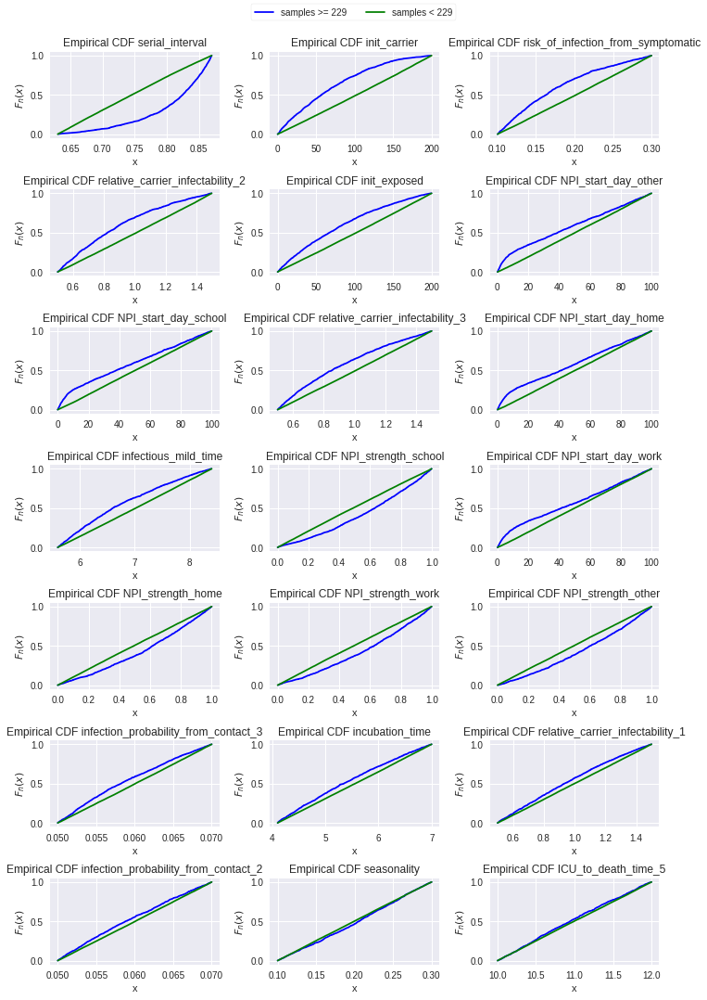

In [106]:
m = 0
fig, ax = plt.subplots(7, 3, figsize=(10,15))
for i in range(7):
    for j in range(3):
        factor_name = important_factors[m]
        sampleA = XA[factor_name].values
        sampleB = XB[factor_name].values
        ax[i,j].plot(np.sort(sampleA), np.linspace(0, 1, len(sampleA), endpoint=False), 
                     label = f'samples >= {int(threshold)}', color = 'blue')
        ax[i,j].plot(np.sort(sampleB), np.linspace(0, 1, len(sampleB), endpoint=False), 
                     label = f'samples < {int(threshold)}', color = 'green')
        ax[i,j].set_title(f"Empirical CDF {factor_name}")
        ax[i,j].set_xlabel('x')
        ax[i,j].set_ylabel(r'$F_n(x)$')
        m += 1

plt.tight_layout()
plt.subplots_adjust(top=0.95) 
#plt.legend(frameon = True, facecolor="white", loc="lower center", ncol=4)
lines_labels = [ax[0,0].get_legend_handles_labels()]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
fig.legend(lines, labels, frameon = True, facecolor="white", loc="upper center", ncol = 2)
#plt.figlegend(lines, labels, loc = 'lower center', ncol=5, labelspacing=0.)
plt.savefig(f'latex_plots/RegionalSA_low_Dead')
plt.show()

In [95]:
print("Largest absolute correlations")
df_corr = get_top_abs_correlations(XA, 25)
df_corr

Largest absolute correlations


NPI_start_day_home                   NPI_strength_home                     0.248449
NPI_start_day_school                 NPI_strength_school                   0.248382
NPI_start_day_other                  NPI_strength_other                    0.242448
NPI_start_day_work                   NPI_strength_work                     0.234529
NPI_start_day_school                 NPI_start_day_home                    0.174930
NPI_start_day_other                  NPI_start_day_school                  0.164691
NPI_strength_other                   serial_interval                       0.135178
NPI_start_day_work                   NPI_start_day_school                  0.134576
                                     NPI_start_day_home                    0.132619
NPI_strength_home                    serial_interval                       0.123706
NPI_start_day_other                  NPI_start_day_home                    0.121075
NPI_strength_school                  serial_interval                       0

# Compute sensitivity indices

In [35]:
df_first = pd.DataFrame()
df_total = pd.DataFrame()

for i in range(len(outputs)):    
    print(f"Compute variance based sensitivity for output: {output_names[i]}.")

    output_agg = outputs[i]
    outputDesign = ot.Sample(output_agg)
    sensitivityAnalysis = ot.JansenSensitivityAlgorithm(inputDesign, outputDesign, size)

    df_first[output_names[i]] = np.array(sensitivityAnalysis.getFirstOrderIndices())
    df_total[output_names[i]] = np.array(sensitivityAnalysis.getTotalOrderIndices())

Compute variance based sensitivity for output: max infected.
Compute variance based sensitivity for output: max dead.
Compute variance based sensitivity for output: mse infected.
Compute variance based sensitivity for output: mse dead.


In [44]:
df_first.index = input_factor_names
df_total.index = input_factor_names
df_first.sort_values(by = ['max dead'], ascending = False).style.format("{:.6f}")

,max infected,max dead,mse infected,mse dead
serial_interval,0.299436,0.285933,0.252309,0.198132
relative_carrier_infectability_2,0.071999,0.051792,0.059983,0.030986
relative_carrier_infectability_3,0.055488,0.042601,0.045779,0.033781
NPI_start_day_other,0.018828,0.014125,0.014967,0.004147
NPI_start_day_home,0.014960,0.011374,0.012004,0.000114
NPI_start_day_school,0.015869,0.010877,0.011932,-0.003430
NPI_start_day_work,0.017188,0.010840,0.014180,-0.001439
infectious_mild_time,0.016794,0.003955,0.032697,0.002357
NPI_strength_school,0.019040,0.002877,0.013771,-0.010869
NPI_strength_home,0.019046,0.002565,0.013285,-0.014970


In [47]:
df_rankings = pd.DataFrame()
for order in ['first', 'total']:
    for i in (output_names):
        if order == 'total':
            df_rankings[f"Ranking after {order} of {i}"] = df_total.sort_values(by = [i], ascending = False).index
        else:
            df_rankings[f"Ranking after {order} of {i}"] = df_first.sort_values(by = [i], ascending = False).index
df_rankings

,Ranking after first of max infected,Ranking after first of max dead,Ranking after first of mse infected,Ranking after first of mse dead,Ranking after total of max infected,Ranking after total of max dead,Ranking after total of mse infected,Ranking after total of mse dead
0,serial_interval,serial_interval,serial_interval,serial_interval,serial_interval,serial_interval,serial_interval,serial_interval
1,relative_carrier_infectability_2,relative_carrier_infectability_2,relative_carrier_infectability_2,relative_carrier_infectability_3,NPI_start_day_school,NPI_start_day_school,NPI_start_day_work,relative_carrier_infectability_2
2,relative_carrier_infectability_3,relative_carrier_infectability_3,relative_carrier_infectability_3,relative_carrier_infectability_2,NPI_start_day_other,NPI_start_day_work,NPI_start_day_other,relative_carrier_infectability_3
3,NPI_strength_other,NPI_start_day_other,infectious_mild_time,NPI_start_day_other,NPI_start_day_work,NPI_start_day_other,NPI_start_day_school,NPI_start_day_school
4,NPI_strength_home,NPI_start_day_home,NPI_start_day_other,infectious_mild_time,NPI_start_day_home,NPI_start_day_home,NPI_start_day_home,NPI_start_day_other
...,...,...,...,...,...,...,...,...
75,hospitalized_cases_per_infectious_5,ICU_to_home_time_2,hospitalized_cases_per_infectious_5,ICU_cases_per_hospitalized_3,ICU_to_home_time_1,ICU_cases_per_hospitalized_0,ICU_to_home_time_1,hospitalized_cases_per_infectious_0
76,infection_probability_from_contact_5,asymptotic_cases_per_infectious_1,hospitalized_cases_per_infectious_4,home_to_hospitalized_time_5,ICU_cases_per_hospitalized_1,ICU_to_death_time_0,ICU_cases_per_hospitalized_1,ICU_to_home_time_0
77,asymptotic_cases_per_infectious_2,asymptotic_cases_per_infectious_2,asymptotic_cases_per_infectious_1,asymptotic_cases_per_infectious_5,ICU_to_death_time_1,ICU_to_home_time_0,ICU_to_death_time_0,hospitalized_to_home_time_0
78,asymptotic_cases_per_infectious_1,asymptotic_cases_per_infectious_5,home_to_hospitalized_time_4,deaths_per_ICU_5,deaths_per_ICU_1,hospitalized_to_home_time_0,ICU_to_death_time_1,home_to_hospitalized_time_0


In [41]:
df_first.sort_values(by = ['mse dead', 'mse infected'], ascending = False).style.format("{:.6f}")

,max infected,max dead,mse infected,mse dead
serial_interval,0.299436,0.285933,0.252309,0.198132
relative_carrier_infectability_3,0.055488,0.042601,0.045779,0.033781
relative_carrier_infectability_2,0.071999,0.051792,0.059983,0.030986
NPI_start_day_other,0.018828,0.014125,0.014967,0.004147
infectious_mild_time,0.016794,0.003955,0.032697,0.002357
NPI_start_day_home,0.014960,0.011374,0.012004,0.000114
NPI_start_day_work,0.017188,0.010840,0.014180,-0.001439
hospitalized_to_ICU_time,-0.001705,-0.003336,-0.002605,-0.002458
NPI_start_day_school,0.015869,0.010877,0.011932,-0.003430
infection_probability_from_contact_3,0.009759,-0.003447,0.007900,-0.007280


In [42]:
df_total.sort_values(by = ['mse dead', 'mse infected'], ascending = False).style.format("{:.6f}")

,max infected,max dead,mse infected,mse dead
serial_interval,0.458074,0.472588,0.454498,0.525925
relative_carrier_infectability_2,0.136222,0.117912,0.136811,0.148294
relative_carrier_infectability_3,0.107340,0.106087,0.113095,0.145195
NPI_start_day_school,0.143860,0.131311,0.148502,0.144439
NPI_start_day_other,0.143222,0.130528,0.149103,0.141215
NPI_start_day_work,0.143085,0.131009,0.149172,0.141169
NPI_start_day_home,0.143048,0.129376,0.148174,0.140526
hospitalized_to_ICU_time,0.000001,0.023667,0.000000,0.077433
NPI_strength_home,0.083627,0.067356,0.083107,0.057802
NPI_strength_other,0.084300,0.066772,0.084081,0.055287


In [43]:
df_first.sort_values(by = ['mse infected', 'mse dead'], ascending = False).style.format("{:.6f}")

,max infected,max dead,mse infected,mse dead
serial_interval,0.299436,0.285933,0.252309,0.198132
relative_carrier_infectability_2,0.071999,0.051792,0.059983,0.030986
relative_carrier_infectability_3,0.055488,0.042601,0.045779,0.033781
infectious_mild_time,0.016794,0.003955,0.032697,0.002357
NPI_start_day_other,0.018828,0.014125,0.014967,0.004147
NPI_start_day_work,0.017188,0.010840,0.014180,-0.001439
NPI_strength_other,0.020589,0.001443,0.013923,-0.016156
NPI_strength_school,0.019040,0.002877,0.013771,-0.010869
NPI_strength_home,0.019046,0.002565,0.013285,-0.014970
NPI_start_day_home,0.014960,0.011374,0.012004,0.000114


In [25]:
from matplotlib.colors import LogNorm

In [38]:
plt.rcParams["axes.grid"] = False

# adjusting: https://stackoverflow.com/questions/13784201/how-to-have-one-colorbar-for-all-subplots
def show_heatmap_of_indices(df, title_str,log = True):
    s_max = np.max(df.iloc[:, :].values)

    selected_ids = [np.arange(0, 25), np.arange(25, 50), np.arange(50, 75)]
    m = 3
    fig, axs = plt.subplots(1,3, figsize = (12, 6))
    for i in range(m):
        if log:
            im = axs[i].imshow((df.iloc[:, :].values[selected_ids[i]]), cmap = 'viridis',norm=LogNorm())
        else:
            im = axs[i].imshow((df.iloc[:, :].values[selected_ids[i]]), cmap = 'viridis', vmin = 0, vmax = s_max) 

        axs[i].set_yticks(np.arange(len(selected_ids[i])))
        axs[i].set_xticks(np.arange(len(df.columns)))

        axs[i].set_yticklabels([input_factor_names[j] for j in selected_ids[i]])
        axs[i].set_xticklabels(df.columns)

        plt.setp(axs[i].get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

    plt.subplots_adjust(top = 0.90)
    fig.suptitle(f"Visualization of {title_str}-order sensitivity indices for different outputs", fontsize=16)

    cax = fig.add_axes([axs[2].get_position().x1+0.01,axs[2].get_position().y0,0.02,axs[2].get_position().height])
    plt.colorbar(im, cax=cax, ) # Similar to fig.colorbar(im, cax = cax)
    plt.show()

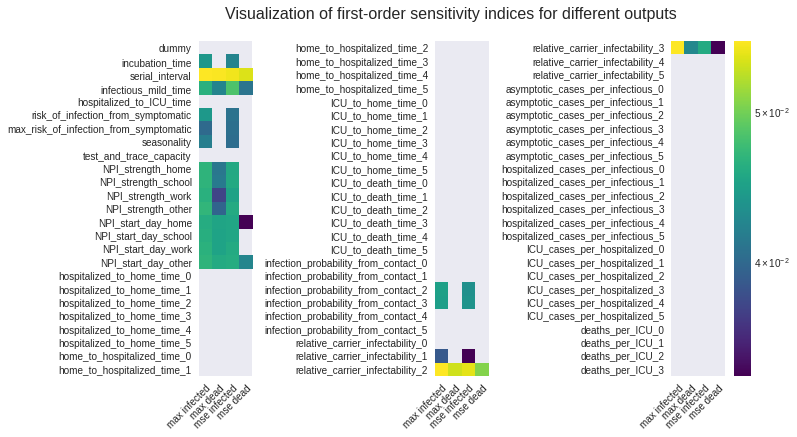

In [39]:
show_heatmap_of_indices(df_first, title_str = 'first')

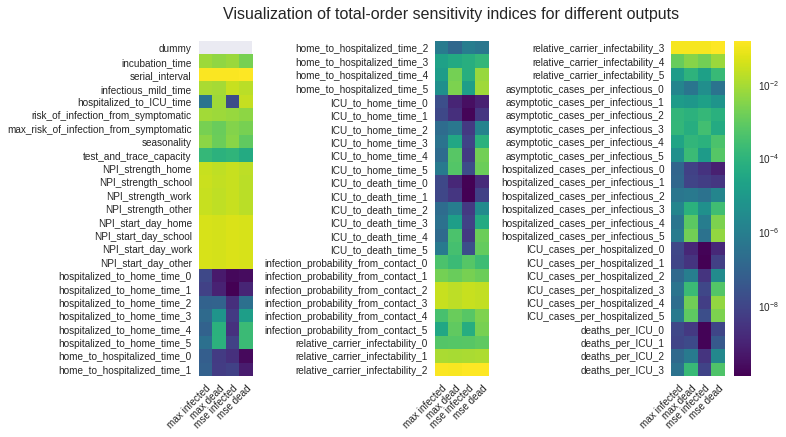

In [40]:
show_heatmap_of_indices(df_total, title_str = 'total')

In [84]:
print(sensitivityAnalysis.getConfidenceLevel())

0.95


In [96]:
output_agg = outputs[0]
outputDesign = ot.Sample(output_agg)
sensitivityAnalysis = ot.JansenSensitivityAlgorithm(inputDesign, outputDesign, size)


first_order = sensitivityAnalysis.getFirstOrderIndices()
total_order = sensitivityAnalysis.getTotalOrderIndices()

total = np.array(total_order)
first = np.array(first_order)
print(first[0], total[0])

0.006868358385268819 0.0


In [79]:
plt.rcParams["axes.grid"] = True
def show_sensitivity_indices(output_agg, aggregation_function, eps = 1e-2, sort_by = 'main'):
    outputDesign = ot.Sample(output_agg)
    sensitivityAnalysis = ot.JansenSensitivityAlgorithm(inputDesign, outputDesign, size)
    #agg_first_order = sensitivityAnalysis.getAggregatedFirstOrderIndices()
    #agg_total_order = sensitivityAnalysis.getAggregatedTotalOrderIndices()
    first_order = sensitivityAnalysis.getFirstOrderIndices()
    total_order = sensitivityAnalysis.getTotalOrderIndices()
    first = np.array(first_order)
    total = np.array(total_order)
    firstCI = sensitivityAnalysis.getFirstOrderIndicesInterval()
    totalCI = sensitivityAnalysis.getTotalOrderIndicesInterval()
    
    sorted_ids = list(map(int, np.argsort(total)))
    n = len(input_factor_names)
    title = f"Sensitivity indices of output: {aggregation_function} (sorted by {sort_by} effect)"
    figsize = (10, 40)
    
    if eps > 0:
        figsize = (10, 20)
        relevant_ids = [i for i, t in enumerate(total) if t > eps]
        # sort indices by first or total effect
        if sort_by == 'main':
            sorted_ids = list(map(int, np.argsort(first)))
        else: 
            sorted_ids = list(map(int, np.argsort(total)))
        sorted_ids = np.array(sorted_ids)
        # only take relevant
        sorted_ids = [int(s) for i, s in enumerate(sorted_ids) if s in relevant_ids]
        title = f"""Main and total sensitivity indices of output: {aggregation_function}\n 
                Shown {len(sorted_ids)} of {n} input factors have total effect > {eps} (sorted by {sort_by} effect)"""
    alp = 0.7
    lw = 2
    fig, axes = plt.subplots(1, 1, figsize=figsize)
    inputArray = np.array(inputDesign)
    x = np.arange(0, 1.1, 0.2)
    y = np.arange(0, len(sorted_ids), 1)
    space = 0.4
    y2 = np.arange(0+space, len(sorted_ids)+space, 1)
    axes.scatter(first[sorted_ids], y, label = "First order indices", c = 'red')
    plt.hlines(y=0, xmin=0, xmax=0, 
                   colors='red', linestyles='-', lw=lw, label = "95% CI of first order indices", alpha = alp)
    axes.scatter(total[sorted_ids], y2, label = "Total order indices", c = 'blue')
    plt.hlines(y=0, xmin=0, xmax=0, 
                   colors='blue', linestyles='-', lw=lw, label = "95% CI of total order indices", alpha = alp)
    for i, j in enumerate(sorted_ids):
        plt.hlines(y=y[i], xmin=firstCI.getMarginal(j).getLowerBound()[0], 
                   xmax=firstCI.getMarginal(j).getUpperBound()[0], 
                   colors='red', linestyles='-', lw=lw, alpha = alp)
        plt.hlines(y=y2[i], xmin=totalCI.getMarginal(j).getLowerBound()[0], 
                   xmax=totalCI.getMarginal(j).getUpperBound()[0], 
                   colors='blue', linestyles='-', lw=lw, alpha = alp)
        plt.annotate(str(np.round(first[sorted_ids[i]], 3)), (first[sorted_ids[i]], y[i]+ 0.25*space), ha='center')
        plt.annotate(str(np.round(total[sorted_ids[i]], 3)), (total[sorted_ids[i]], y2[i]+ 0.25*space), ha='center')

    #axes.set_ylabel(input_factor_names[i], rotation = 0, fontsize = 12, labelpad = 20, ha = 'right')
    axes.set_xticks(x)
    axes.set_yticks(y)
    axes.set_yticklabels([input_factor_names[k] for k in sorted_ids], fontsize = 14)
    plt.legend(loc='upper right')
    plt.ylim([-0.2, len(sorted_ids)])
    plt.xlim([-0.2, 1.2])
    plt.title(title, fontsize = 18)
    plt.tight_layout()
    plt.show()

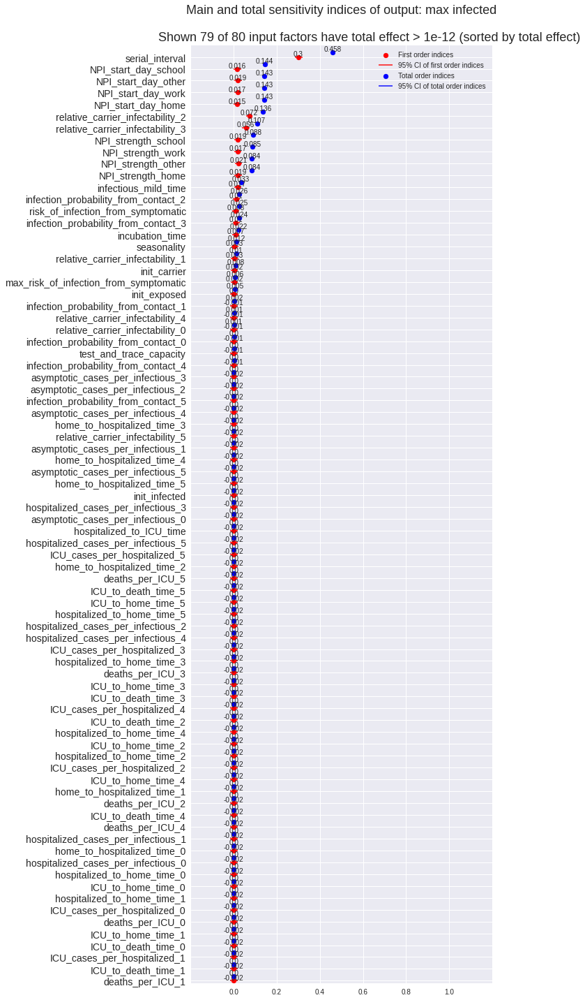

In [118]:
show_sensitivity_indices(output_agg = outputs[0], aggregation_function=output_names[0], eps = 1e-12, sort_by = 'total')

## Visualize most sensitive indices

In [204]:
# take only factors with total effect larger epsilon
eps = 1e-2
relevant_ids = [i for i, t in enumerate(total) if t > eps]

# sort indices by main effect
sorted_ids = list(map(int, np.argsort(first)))
sorted_ids = np.array(sorted_ids)

# only take relevant
relevant_sorted_ids = [int(s) for i, s in enumerate(sorted_ids) if s in relevant_ids]

relevant_idx = list(reversed(relevant_sorted_ids)) #[i for i, o in enumerate(total) if o > eps]
print(relevant_sorted_ids)
print(relevant_idx)
relevant_columns = [list(df.columns)[i] for i in relevant_idx]
relevant_columns

[9, 5, 2, 39, 40, 1, 8, 6, 7, 12, 10, 11, 3, 0]
[0, 3, 11, 10, 12, 7, 6, 8, 1, 40, 39, 2, 5, 9]


['serial_interval',
 'risk_of_infection_from_symptomatic',
 'damping_time_work',
 'damping_time_school',
 'damping_time_other',
 'damping_coeff_work',
 'damping_coeff_school',
 'damping_coeff_other',
 'infectious_mild_time',
 'infection_probability_from_contact_3',
 'infection_probability_from_contact_2',
 'hospitalized_to_ICU_time',
 'damping_coeff_home',
 'damping_time_home']

In [140]:
def show_cobweb(df, output_agg, aggregation_function, eps = 1e-2, show_above = True, sort_by = 'main'):
    ### prepare data
    outputDesign = ot.Sample(output_agg)
    sensitivityAnalysis = ot.JansenSensitivityAlgorithm(inputDesign, outputDesign, size)
    
    first_order = sensitivityAnalysis.getFirstOrderIndices()
    total_order = sensitivityAnalysis.getTotalOrderIndices()
    first = np.array(first_order)
    total = np.array(total_order)
    firstCI = sensitivityAnalysis.getFirstOrderIndicesInterval()
    totalCI = sensitivityAnalysis.getTotalOrderIndicesInterval()
    
    if show_above:
        relevant_ids = [i for i, t in enumerate(total) if t > eps]
    else: 
        relevant_ids = [i for i, t in enumerate(total) if t < eps]
    # sort indices by main effect
    if sort_by == 'main':
            sorted_ids = list(map(int, np.argsort(first)))
    else: 
        sorted_ids = list(map(int, np.argsort(total)))
    sorted_ids = np.array(sorted_ids)
    # only take relevant
    relevant_sorted_ids = [int(s) for i, s in enumerate(sorted_ids) if s in relevant_ids]
    relevant_sorted_ids = list(reversed(relevant_sorted_ids)) #[i for i, o in enumerate(total) if o > eps]
    relevant_columns = [list(df.columns)[i] for i in relevant_sorted_ids]
    print(relevant_columns)
    
    ### prepare plot
    dims = []
    for i,  rx in enumerate(relevant_sorted_ids):
        dims.append(dict(range = [distributions[rx].getRange().getLowerBound()[0], distributions[rx].getRange().getUpperBound()[0]], 
                        label = relevant_columns[i],
                        values = df[relevant_columns[i]]))
    dims.append(dict(
        range = [0, df[aggregation_function].max()], 
        label = f"output {aggregation_function}", values = df[aggregation_function]))
    #dims[2].update(constraintrange = [6, 7.0])
    #dims[0].update(constraintrange = [3.935, 4.2])
    #dims[-1].update(constraintrange = [10000, 14000])
    color_categories = [[0, 'purple'], [0.25, 'lightseagreen'], [0.75, 'gold'], [1., 'white']]
    ### plot 
    fig = go.Figure(data =
                       go.Parcoords(
                       line = dict(color = df[aggregation_function],
                                  colorscale = color_categories, #continous: 'Electric', 
                                  showscale = True, 
                                  cmin = 0,
                                  cmax = df[aggregation_function].max(),
                                  ),
                       dimensions = dims,
                       labelangle = 45,
                       ),
                   layout = go.Layout(margin = go.layout.Margin(t = 220))
                   )
    fig.update_layout(title=go.layout.Title(
                        text=f"Cobweb visualization of most important inputs for {aggregation_function}" \
                        f"T_i > {eps}).<br>Sorted by main effect",
                        y=0.95
                        ),
                     )
        #title = f"Cobweb visualization of most important inputs (T_i > {eps}). ")
    fig.show()

In [139]:
show_cobweb(df = df, output_agg = outputs[0], aggregation_function = output_names[0], eps = 1e-5, sort_by = 'main')

[42, 43, 47, 24, 45, 23, 46, 38, 70, 39, 68, 69, 13, 12, 41, 11, 10, 40, 6, 7, 2, 9, 8, 4, 1]
[1, 4, 8, 9, 2, 7, 6, 40, 10, 11, 41, 12, 13, 69, 68, 39, 70, 38, 46, 23, 45, 24, 47, 43, 42]
['infection_probability_from_contact_4', 'infection_probability_from_contact_5', 'asymptotic_cases_per_infectious_3', 'home_to_hospitalized_time_4', 'asymptotic_cases_per_infectious_1', 'home_to_hospitalized_time_3', 'asymptotic_cases_per_infectious_2', 'infection_probability_from_contact_0', 'init_infected', 'infection_probability_from_contact_1', 'init_exposed', 'init_carrier', 'damping_time_other', 'damping_time_work', 'infection_probability_from_contact_3', 'damping_time_school', 'damping_time_home', 'infection_probability_from_contact_2', 'damping_coeff_home', 'damping_coeff_school', 'infectious_mild_time', 'damping_coeff_other', 'damping_coeff_work', 'risk_of_infection_from_symptomatic', 'serial_interval']


In [142]:
show_cobweb(df = df, output_agg = outputs[0], aggregation_function = output_names[0], eps = 1e-7, show_above = False, sort_by = 'main')

['ICU_to_death_time_0', 'deaths_per_ICU_0', 'init_dead', 'hospitalized_to_home_time_3', 'ICU_to_death_time_5', 'ICU_to_death_time_2', 'deaths_per_ICU_4', 'ICU_to_death_time_4', 'deaths_per_ICU_5', 'deaths_per_ICU_3', 'max_risk_of_infection_from_symptomatic', 'dummy', 'ICU_to_home_time_5', 'ICU_to_death_time_3', 'ICU_cases_per_hospitalized_2', 'hospitalized_to_home_time_5', 'ICU_cases_per_hospitalized_3', 'ICU_to_home_time_4', 'ICU_cases_per_hospitalized_5', 'ICU_to_home_time_2', 'ICU_cases_per_hospitalized_1', 'hospitalized_to_home_time_4', 'ICU_to_home_time_3', 'ICU_cases_per_hospitalized_4', 'deaths_per_ICU_2', 'ICU_to_death_time_1', 'deaths_per_ICU_1', 'hospitalized_to_home_time_2']


In [137]:
show_cobweb(df = df, output_agg = outputs[1], aggregation_function = output_names[1], eps = 1e-3, sort_by = 'main')

[42, 60, 43, 24, 25, 55, 39, 67, 66, 70, 68, 69, 3, 40, 41, 6, 7, 9, 8, 2, 13, 12, 10, 11, 4, 1]
[1, 4, 11, 10, 12, 13, 2, 8, 9, 7, 6, 41, 40, 3, 69, 68, 70, 66, 67, 39, 55, 25, 24, 43, 60, 42]
['serial_interval', 'risk_of_infection_from_symptomatic', 'damping_time_school', 'damping_time_home', 'damping_time_work', 'damping_time_other', 'infectious_mild_time', 'damping_coeff_work', 'damping_coeff_other', 'damping_coeff_school', 'damping_coeff_home', 'infection_probability_from_contact_3', 'infection_probability_from_contact_2', 'hospitalized_to_ICU_time', 'init_carrier', 'init_exposed', 'init_infected', 'deaths_per_ICU_4', 'deaths_per_ICU_5', 'infection_probability_from_contact_1', 'hospitalized_cases_per_infectious_5', 'home_to_hospitalized_time_5', 'home_to_hospitalized_time_4', 'infection_probability_from_contact_5', 'ICU_cases_per_hospitalized_4', 'infection_probability_from_contact_4']


In [205]:
print(relevant_idx)
dims = []
for i,  rx in enumerate(relevant_idx):
    dims.append(dict(range = [distributions[rx].getRange().getLowerBound()[0], distributions[rx].getRange().getUpperBound()[0]], 
                    label = relevant_columns[i],
                    values = df[relevant_columns[i]]))

#dims[2].update(constraintrange = [6, 7.0])
dims[0].update(constraintrange = [3.935, 4.2])

dims.append(dict(
    range = [0, df['output_agg'].max()], constraintrange = [10000, 14000],
    label = "output", values = df['output_agg']))

[0, 3, 11, 10, 12, 7, 6, 8, 1, 40, 39, 2, 5, 9]


In [206]:
fig = go.Figure(data =
                   go.Parcoords(
                   line = dict(color = df['output_agg'],
                              colorscale = color_categories, #continous: 'Electric', 
                              showscale = True, 
                              cmin = 0,
                              cmax = df['output_agg'].max(),
                              ),
                   dimensions = dims,
                   labelangle = 45,
                   ),
               layout = go.Layout(margin = go.layout.Margin(t = 150))
               )
fig.show()

In [195]:
# take only factors with total effect larger epsilon
eps = 1e-8
relevant_ids = [i for i, t in enumerate(total) if t <= eps]

# sort indices by total effect
sorted_ids = list(map(int, np.argsort(total)))
sorted_ids = np.array(sorted_ids)

# only take relevant
relevant_sorted_ids = [int(s) for i, s in enumerate(sorted_ids) if s in relevant_ids]

relevant_idx = list(reversed(relevant_sorted_ids)) #[i for i, o in enumerate(total) if o > eps]
print(relevant_sorted_ids)
print(relevant_idx)
print(len(relevant_idx))
relevant_columns = [list(df.columns)[i] for i in relevant_idx]
relevant_columns

[4, 19, 49, 13, 20, 14, 55, 50, 56, 25]
[25, 56, 50, 55, 14, 20, 13, 49, 19, 4]
10


['ICU_to_home_time_0',
 'ICU_cases_per_hospitalized_1',
 'hospitalized_cases_per_infectious_1',
 'ICU_cases_per_hospitalized_0',
 'hospitalized_to_home_time_1',
 'home_to_hospitalized_time_1',
 'hospitalized_to_home_time_0',
 'hospitalized_cases_per_infectious_0',
 'home_to_hospitalized_time_0',
 'max_risk_of_infection_from_symptomatic']

In [201]:
dims = []
for i,  rx in enumerate(relevant_idx):
    dims.append(dict(range = [distributions[rx].getRange().getLowerBound()[0], distributions[rx].getRange().getUpperBound()[0]], 
                    label = relevant_columns[i],
                    values = df[relevant_columns[i]]))

dims.append(dict(
    range = [0, df['output_agg'].max()], constraintrange = [10000, 14000],
    label = "output", values = df['output_agg']))

fig = go.Figure(data =
                   go.Parcoords(
                   line = dict(color = df['output_agg'],
                              colorscale = color_categories, #continous: 'Electric', 
                              showscale = True, 
                              cmin = 0,
                              cmax = df['output_agg'].max(),
                              ),
                   dimensions = dims,
                   labelangle = 45,
                   ),
               layout = go.Layout(margin = go.layout.Margin(t = 150))
               )
fig.show()

# Second order Sensitivity Analysis

In [62]:
with open('Studies/study_dead_sobol_second_order.pkl', 'rb') as f:
    size = pickle.load(f)
    input_factor_names = pickle.load(f)
    distributions = pickle.load(f) # saved as coll (collection of distributions)
    static_params = pickle.load(f)
    inputDesign = pickle.load(f)
    sim_out = pickle.load(f)

In [63]:
aggregation_function = "max"

if aggregation_function == "max":
    output_agg = np.max(sim_out, axis = 1, keepdims = True)
elif aggregation_function == "sum":
    output_agg = np.sum(sim_out, axis = 1, keepdims=True)
elif aggregation_function == "mean":
    output_agg = np.mean(sim_out, axis = 1, keepdims=True)
    
outputDesign = ot.Sample(output_agg)
sensitivityAnalysis = ot.JansenSensitivityAlgorithm(inputDesign, outputDesign, size)

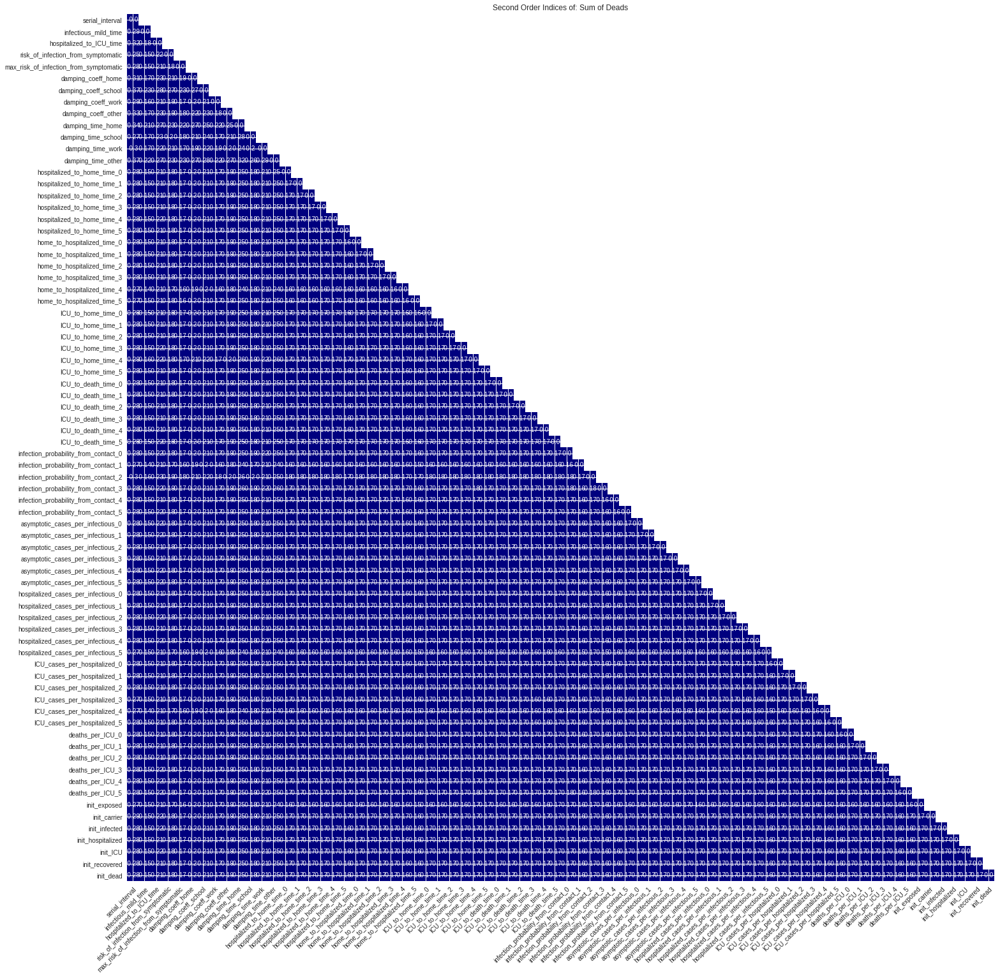

In [64]:
second_order = sensitivityAnalysis.getSecondOrderIndices()*(-1)
mask = np.ones_like(second_order)
mask[np.tril_indices_from(mask)] = False

f, ax = plt.subplots(figsize = (25,25))

masked_secondorder = np.ma.array(second_order, mask = mask)

cmap = cm.get_cmap('jet', 25)
cmap.set_bad('w')

im = ax.imshow(masked_secondorder, 
                #mask = mask, linewidth = 1, annot = True, 
                       #xticklabels = input_factor_names, yticklabels = input_factor_names, 
                vmin = 0, vmax = 1, cmap = cmap)


ax.set_xticks(np.arange(len(input_factor_names)))
ax.set_yticks(np.arange(len(input_factor_names)))

ax.set_xticklabels(input_factor_names)
ax.set_yticklabels(input_factor_names)

plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")


for i in range(len(input_factor_names)):
    for j in range(len(input_factor_names)):
        text = ax.text(j, i, np.round(second_order[i, j], 2),
                       ha="center", va="center", color="w")

ax.set_title("Second Order Indices of: Sum of Deads")


plt.show()

In [65]:
eps = 1e-2
(np.array(second_order).sum(axis =1) > eps).sum()
second_order = np.array(second_order)
relevant_ids = np.array(second_order).sum(axis =1) > eps

In [66]:
relevant_names = np.array(input_factor_names)[relevant_ids]
len(relevant_names)

0

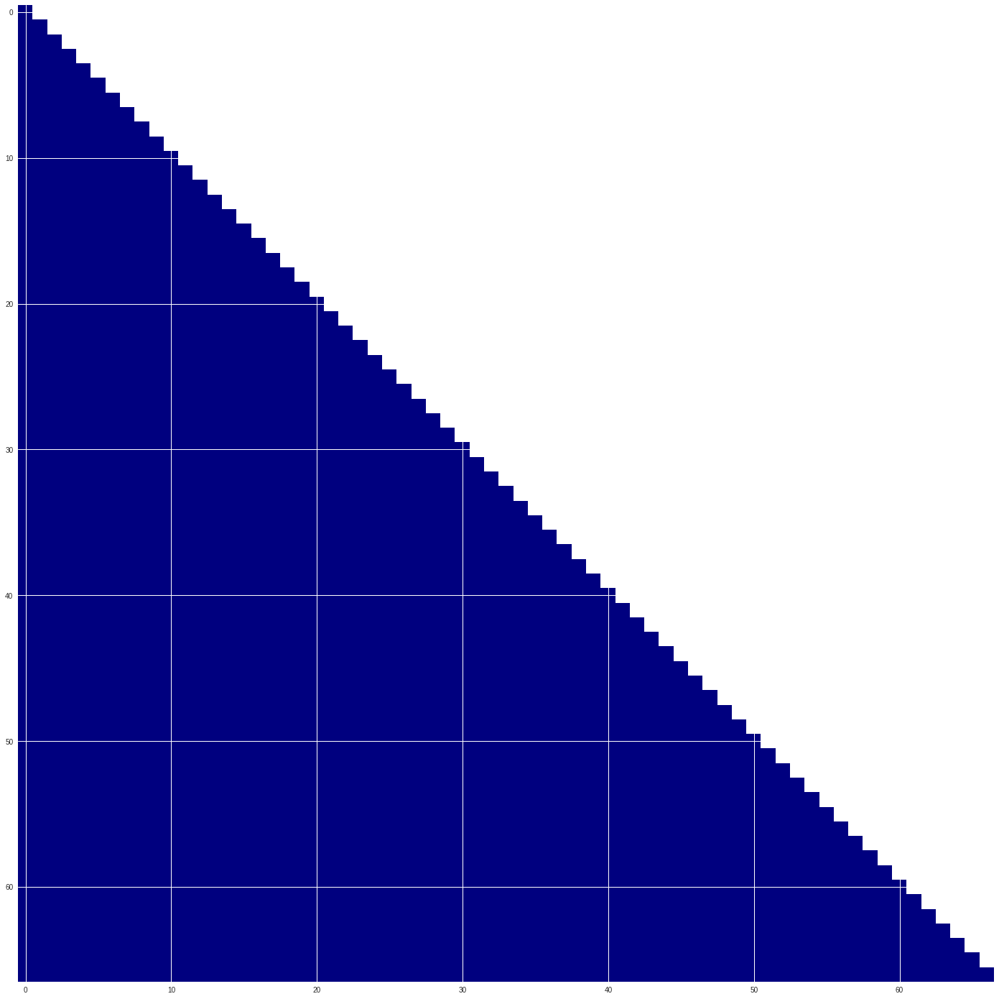

In [119]:
reduced_matrix = second_order[relevant_ids, :][:, relevant_ids]

mask = np.ones_like(reduced_matrix)
mask[np.tril_indices_from(mask)] = False

f, ax = plt.subplots(figsize = (25,25))

masked_secondorder = np.ma.array(reduced_matrix, mask = mask)

cmap = cm.get_cmap('jet', 25)
cmap.set_bad('w')

im = ax.imshow(masked_secondorder, 
                #mask = mask, linewidth = 1, annot = True, 
                       #xticklabels = input_factor_names, yticklabels = input_factor_names, 
                vmin = 0, vmax = 1, cmap = cmap)

ax.set_xticks(np.arange(len(relevant_names)))
ax.set_yticks(np.arange(len(relevant_names)))

ax.set_xticklabels(relevant_names)
ax.set_yticklabels(relevant_names)

plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")


for i in range(len(relevant_names)):
    for j in range(len(relevant_names)):
        text = ax.text(relevant_names[j], relevant_names[i], np.round(reduced_matrix[i, j], 2),
                       ha="center", va="center", color="w")

ax.set_title("Second Order Indices of: Sum of Deads")



plt.show()